# Data

In [1]:
%load_ext autoreload
%autoreload 2

In [3]:
import contextlib
import pickle
import scipy.sparse
import random
import time
import os
import glob
from collections import defaultdict

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.cm as cm
from matplotlib.backends.backend_pdf import PdfPages


from sklearn.metrics import mean_squared_error



from sklearn.neighbors import kneighbors_graph

import torch
import torch.nn as nn
import torch.optim as optim


sns.set_style('whitegrid')
sns.set_palette('pastel')
sns.set_context('poster')

import warnings
warnings.filterwarnings("ignore")

## Import data

In [4]:
with open('irise_weekly_and_refit.pk', 'rb') as f:
    data = pickle.load(f)
    
refit, irise = data['refit'], data['irise']

refit_weekly = [{
    'X': {k: v.iloc[168*week: 168*(week + 1)] for k, v in refit['X'].items()},
    'X_bar': refit['X_bar'].iloc[168*week: 168*(week + 1)],
    }
    for week in range(len(refit['X_bar']) // 168)
]

In [5]:
reshaped_irise = []
reshaped_refit = []

for ind, week_data in enumerate(irise):
    current = dict()
    for house in week_data['X']['TV'].columns:
        new_df = pd.concat(
            [week_data['X'][appliance][house] for appliance in week_data['X'].keys()] + [week_data['X_bar'][house]],
            axis = 1,
        )
        new_df.columns = list(week_data['X'].keys()) + ['aggregate']
        current[house] = new_df
    reshaped_irise.append(current)

for ind, week_data in enumerate(refit_weekly):
    current = dict()
    for house in week_data['X']['TV'].columns:
        new_df = pd.concat(
            [week_data['X'][appliance][house] for appliance in week_data['X'].keys()] + [week_data['X_bar'][house]],
            axis = 1,
        )
        new_df.columns = list(week_data['X'].keys()) + ['aggregate']
        current[house] = new_df
    reshaped_refit.append(current)

    
combined_data_weekly = [
    {**reshaped_irise[week], **reshaped_refit[week]} for week in range(min(len(reshaped_irise), len(reshaped_refit)))
]


# **Algorithms & Params**

### Deep Sparse Coding (Autoencoder with a sparsity penalty)

In [6]:
class DeepSC(nn.Module):
    def __init__(self, input_dim, hidden_dim1, hidden_dim2, code_dim, sparsity_penalty, appliance):
        super(DeepSC, self).__init__()
        model_params['input_dim'] = input_dim
        model_params['hidden_dim1'] = hidden_dim1
        model_params['hidden_dim2'] = hidden_dim2
        model_params['code_dim'] = code_dim
        model_params['input_dim'] = input_dim
        self.sparsity_penalty = sparsity_penalty
        self.appliance = appliance
        
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, hidden_dim1),
            nn.ReLU(),
            nn.Linear(hidden_dim1, hidden_dim2),
            nn.ReLU(),
            nn.Linear(hidden_dim2, code_dim)
        )
        
        self.decoder = nn.Sequential(
            nn.Linear(code_dim, hidden_dim2),
            nn.ReLU(),
            nn.Linear(hidden_dim2, hidden_dim1),
            nn.ReLU(),
            nn.Linear(hidden_dim1, input_dim),
            nn.ReLU(),
        )

        self.encoder = nn.Sequential(
            nn.Conv1d(input_dim, hidden_dim1, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv1d(hidden_dim1, code_dim, kernel_size=3, padding=1)
        )
        
        self.decoder = nn.Sequential(
            nn.ConvTranspose1d(code_dim, hidden_dim1, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.ConvTranspose1d(hidden_dim1, input_dim, kernel_size=3, padding=1),
            nn.ReLU(),
        )
    
    def forward(self, x):
        # Encoding
        enc = self.encoder(x)
        # Decoding
        dec = self.decoder(enc)
        return enc, dec
    
    def loss(self, x, enc, dec, y):
        reconstruction_loss = torch.norm(dec - y, 'fro')
        sparsity_loss = self.sparsity_penalty * torch.norm(enc, 1)
        negativity_loss = 0.1 * torch.mean(torch.clamp(-enc, min=0.0) ** 2)
        loss = reconstruction_loss + sparsity_loss# + negativity_loss
        return x, loss, reconstruction_loss, sparsity_loss, negativity_loss


### Training function

In [7]:
def deep_sc_train_local_block(X, Y, appliance, input_dim, hidden_dim1, hidden_dim2, code_dim, sparsity_penalty, num_iterations, lr, global_state_dict=None):
    reconstructions = []#defaultdict(list)
    sparsities = []#defaultdict(list)
    losses = []#defaultdict(list)
    #models = defaultdict(list)

    model = DeepSC(input_dim, hidden_dim1, hidden_dim2, code_dim, sparsity_penalty, appliance)
    
    # load global model parameters
    if global_state_dict is not None:
        model.load_state_dict(global_state_dict)
        
    for param in model.parameters():
        param.requires_grad = True
    optimizer = optim.Adam(model.parameters(), lr)

    X = torch.tensor(X.values, dtype=torch.float32).T.unsqueeze(0).unsqueeze(2)
    Y = torch.tensor(Y.values, dtype=torch.float32).T.unsqueeze(0).unsqueeze(2)
    for i in range(num_iterations):
        print('iter', i)
        optimizer.zero_grad()
        enc, dec = model.forward(X)
        x, loss, reconstruction_loss, sparsity_loss, negativity_loss  = model.loss(X, enc, dec, Y)
        print('----> reconstruction loss', reconstruction_loss.detach().numpy())
        print('----> sparsity loss', sparsity_loss.detach().numpy())
        print('----> negativity loss', negativity_loss.detach().numpy())
        print('----> total loss', loss.detach().numpy())
        loss.backward()
        optimizer.step()

        reconstructions.append(reconstruction_loss.detach().numpy())
        sparsities.append(sparsity_loss.detach().numpy())
        losses.append(loss.detach().numpy())
            
        print('\n-----------------------------------------------------------------------------\n')
            
    return model, reconstructions, sparsities, losses, enc, dec



### Metric functions

In [8]:
def dd_acc_cat(y_apps, y_true, x_bar):
    s = 0
    acc_dict = dict()
    for cat_ind, cat in enumerate(appliance_categories):
        y_app = y_apps[cat]
        y_real = y_true[cat]
        s += np.sum(np.abs(y_real - y_app), axis=0)
        acc_dict[cat] = np.sum(np.abs(y_real - y_app), axis=0)
        den = 2*x_bar.sum(axis=0)
    return np.round(1 - s/den, 3), np.round(np.mean(1 - s/den), 3), {cat: 1 - v/den for cat,v in acc_dict.items()}


def dd_acc_cat_non_zero(y_apps, y_true, x_bar):
    s = 0
    total_acc = 0
    sum_diff = 0
    for cat_ind, cat in enumerate(appliance_categories):
        y_app = y_apps[cat]
        y_real = y_true[cat].values

        non_zero_inds = [ind for (ind, elt) in enumerate(y_real) if elt != 0] # np.nonzero(y_real)
        sub_real = y_real[non_zero_inds]
        sub_pred = y_app[non_zero_inds]
        sum_diff += np.sum(np.abs(sub_real - np.ravel(sub_pred)))

    den = 2*x_bar.sum()
    total_acc += 1 - sum_diff/den

    return np.round(total_acc, 3)


def dd_error_per_category(y_app, y_true):
    non_zero_inds = [ind for (ind, elt) in enumerate(y_true) if elt != 0]
    if len(non_zero_inds) == 0:
        # appliance not working the whole time
        return None, None
    return (
        np.sqrt(mean_squared_error(y_true, y_app)),
        np.sqrt(mean_squared_error(y_true, y_app))/np.linalg.norm(y_true, 2),
    )

def dd_error_non_zero_per_category(y_app, y_true):
    # when the appliance is working
    non_zero_inds = [ind for (ind, elt) in enumerate(y_true) if elt != 0]
    if len(non_zero_inds) == 0:
        # appliance not working the whole time
        return None, None
    y_true_non_zero = y_true[non_zero_inds]
    y_app_non_zero = y_app[non_zero_inds]
    
    return (
        np.sqrt(mean_squared_error(y_true_non_zero, y_app_non_zero)),
        np.sqrt(mean_squared_error(y_true_non_zero, y_app_non_zero))/np.linalg.norm(y_true_non_zero, 2),
    )


# **Federated Learning Framework for Deep Learning**

In [9]:
class FederatedNILM:
    
    def __init__(
        self,
        agg_funcs,
        aggregate_func_type,
        clients_data,
        test_data,
        appliance_categories,
        model,
        training_function,
        training_func_args,
        model_params,
        pipeline_params,
    ):
        self.clients_data = clients_data # in practice, this is not accessible.
        self.test_data = test_data # in practice, this is not accessible.
        self.appliance_categories = appliance_categories
        self.model = model
        self.training_function = training_function
        self.model_params = model_params
        self.pipeline_params = pipeline_params
        (self.aggregate_func, self.agg_func_weights, self.reweighting_function) = self.get_aggregate_func(agg_funcs, aggregate_func_type)
        
        print(
            'Aggregate function is {}, fetched function {}, func args are {}'.format(
                aggregate_func_type, self.aggregate_func, self.agg_func_weights
            )
        )
        print(
            'Re-weighting function is {}'.format(self.reweighting_function)
        )
        self.training_func_args = training_func_args
        self.convergence_metrics = []
        
    def get_aggregate_func(self, agg_funcs, aggregate_func_type):
        agg_func_tuple = agg_funcs.get(aggregate_func_type)
        if agg_func_tuple is None:
            raise KeyError('Invalid aggregate function, choose from list {}'.format(agg_func_list))
            return None
        return agg_func_tuple
        

    def run_fed_avg(self, training_func_args):
        # 0) Initialize models
        self.appliance_models = self.initialize_models()
        # 1) While not converged, train a separate model for each house and return the learnt model's weights
        convergence = False
        t = 0
        current_global_state_dicts = {
            category: None for category in self.appliance_categories
        }
        
        self.last_encoder_outputs = defaultdict(dict)    
        self.last_local_predictions = defaultdict(dict)
        self.round_train_preds = []
        self.round_test_preds = []
        
        while not convergence and t < self.pipeline_params['max_iter_fl']:
            print('FL Training round {}'.format(t))
            local_appliance_models = dict()
            round_metrics = defaultdict(dict)
            for house, house_train in list(self.clients_data.items()):
                print('sending to ', house)
                with contextlib.redirect_stdout(None):
                    models, rec, spar, loss_dict, encoder_output, decoder_output = self.train_model_remotely(
                        house_train, current_global_state_dicts, training_func_args
                    )
                local_appliance_models[house] = models
                # Save losses for analytics
                round_metrics['Reconstruction'][house] = rec
                round_metrics['Sparsity'][house] = spar
                round_metrics['Total Loss'][house] = loss_dict
                self.last_encoder_outputs[house] = encoder_output
                self.last_local_predictions[house] = decoder_output
                
            self.convergence_metrics.append(round_metrics)
            print('Finished local round of houses')
            
            self.local_appliance_models = local_appliance_models
            #aggregation
            self.appliance_models = self.aggregate_local_models()
            # modify current state dict
            current_global_state_dicts = {
                category: self.appliance_models[category].state_dict() for category in self.appliance_categories
            }
            
            # current round predictions
            self.round_train_preds.append(self.predict_all_train())
            self.round_test_preds.append(self.predict_all())
            
            if self.reweighting_function is not None:
                self.agg_func_weights = self.reweighting_function(
                    train,
                    appliance_categories,
                    precomputed_enc=self.last_encoder_outputs,
                )
            print(self.agg_func_weights['fridge'])
            
            
            
            #previous_appliance_models = self.appliance_models
            t += 1
        return self.appliance_models


    def initialize_models(self):
        """
        Type: Dict
        Key: appliance category
        Value: model weights
        """
        return {category: self.model(*self.model_params.values(), category) for category in self.appliance_categories}

    def train_model_remotely(self, house_train, current_global_state_dicts, training_func_args):
        """
        Send the model to each house at a timestamp t
        """
        models = dict()
        rec = dict()
        spar = dict()
        loss_dict = dict()
        encoder_output = dict()
        decoder_output = dict()
        for category in self.appliance_categories:
            print(category)

            model, reconstructions, sparsities, losses, enc, dec = self.training_function(
                house_train['aggregate'],
                house_train[category],
                category,
                *self.training_func_args,
                current_global_state_dicts[category],
            )
            models[category] = model
            rec[category] = reconstructions
            spar[category] = sparsities
            loss_dict[category] = losses
            encoder_output[category] = enc.squeeze().detach().numpy()
            decoder_output[category] = dec.squeeze().detach().numpy()

        return models, rec, spar, loss_dict, encoder_output, decoder_output

    def aggregate_local_models(self):
        """
        Aggregate locally learnt models
        """
        return {
            category: self.aggregate_func(
                {
                    house: local_house_models[category]
                    for house, local_house_models in self.local_appliance_models.items()
                },
                self.appliance_models[category],
                self.agg_func_weights[category]
            )
            for category in self.appliance_categories
        }

    def federated_learning_convergence(self):
        """
        test for convergence of aggregate matrices
        """
        variations = []
        for category in self.appliance_categories:
            var = np.linalg.norm(self.B_t[category] - Bs_to_compare[category])
            variations.append(var)
            print('current B variation for {} is {}'.format(category, var))
        if any(var > threshold for var in variations):
            return False
        return True

    def predict_all(self):
        predictions = defaultdict(dict)
        accs = defaultdict()
        non_zero_accs = defaultdict()
        errors = defaultdict(dict)
        errors_non_zero = defaultdict(dict)
        for house, house_test in list(self.test_data.items()):
            for category in self.appliance_categories:
                print('predicting {} for house {}'.format(category, house))
                X_test = torch.tensor(house_test['aggregate'].values, dtype=torch.float32).T.unsqueeze(0).unsqueeze(2)
                pred = self.appliance_models[category].forward(X_test)[1].squeeze().detach().numpy()

                predictions[house][category] = pred
                errors[house][category] = dd_error_per_category(pred, house_test[category].values)
                errors_non_zero[house][category] = dd_error_non_zero_per_category(pred, house_test[category].values)
            
            accs[house] = dd_acc_cat(predictions[house], house_test, house_test['aggregate'].values)
            non_zero_accs[house] = dd_acc_cat_non_zero(predictions[house], house_test, house_test['aggregate'].values)
        
        return predictions, errors, errors_non_zero, accs, non_zero_accs
    
    def predict_all_train(self):
        predictions = defaultdict(dict)
        accs = defaultdict()
        non_zero_accs = defaultdict()
        errors = defaultdict(dict)
        errors_non_zero = defaultdict(dict)
        for house, house_test in list(self.clients_data.items()):
            for category in self.appliance_categories:
                print('predicting {} for house {}'.format(category, house))
                X_test = torch.tensor(house_test['aggregate'].values, dtype=torch.float32).T.unsqueeze(0).unsqueeze(2)
                pred = self.appliance_models[category].forward(X_test)[1].squeeze().detach().numpy()

                predictions[house][category] = pred
                errors[house][category] = dd_error_per_category(pred, house_test[category].values)
                errors_non_zero[house][category] = dd_error_non_zero_per_category(pred, house_test[category].values)
            
            accs[house] = dd_acc_cat(predictions[house], house_test, house_test['aggregate'].values)
            non_zero_accs[house] = dd_acc_cat_non_zero(predictions[house], house_test, house_test['aggregate'].values)
        
        return predictions, errors, errors_non_zero, accs, non_zero_accs


### Aggregation functions

In [10]:
import torch.optim as optim


def FedAvg(local_models, global_model, weights): # weights is just a placeholder for the code to work properly ^_^
    global_state_dict = global_model.state_dict()
    for key in global_state_dict.keys():
        global_state_dict[key] = torch.mean(torch.stack([local_model.state_dict()[key] for local_model in local_models.values()]), dim=0)
    global_model.load_state_dict(global_state_dict)
    return global_model


def FedDA(local_models, global_model, weights):
    global_state_dict = global_model.state_dict()
    for key in global_state_dict.keys(): 

        global_state_dict[key] = torch.sum(torch.stack([weights[ind]*local_model.state_dict()[key] for ind, local_model in enumerate(list(local_models.values()))]), dim=0)
        global_model.load_state_dict(global_state_dict)
    return global_model


def FedMMD(local_models, global_model):
    mmd_weights = estimate_FedMMD_weights()
    return FedDA(local_models, global_model, mmd_weights)



## Plotting functions

In [35]:
def plot_all_convergence_plots(convergence_metrics_list, filename_suffix=''):
    figs, axes = [], []
    for train_round in range(len(convergence_metrics_list)):
        loss_dicts = convergence_metrics_list[train_round]
        for term, loss_dict_all_houses in loss_dicts.items():
            for house, loss_dict in loss_dict_all_houses.items():
                fig, ax = plt.subplots(figsize=(20,20), nrows=len(list(loss_dict.keys())), ncols=2)
                for ind, (appliance, term_list) in enumerate(loss_dict.items()):
                    
                    fig.suptitle('Convergence plot for {} term, house {}, round {}'.format(term, house, train_round), fontsize=20)
                    ax[ind, 0].plot(term_list, linewidth=4)
                    ax[ind, 0].set_title('{} convergence plot\n for {}'.format(term, appliance))
                    ax[ind, 0].set_ylim(ymin=0)
                    ax[ind, 0].set_xlim(xmin=0)
                    ax[ind, 0].set_xlabel('Epoch')
                    ax[ind, 0].set_ylabel('Loss')
                    if 0 in term_list:
                        continue
                    ax[ind, 1].plot(np.log(term_list), linewidth=4)
                    ax[ind, 1].set_title('Log-scale {} convergence plot\n for {}'.format(term, appliance))
                    ax[ind, 1].set_ylim(ymin=0)
                    ax[ind, 1].set_xlim(xmin=0)
                    ax[ind, 1].set_xlabel('Epoch')
                    ax[ind, 1].set_ylabel('Loss')

                fig.tight_layout()

                figs.append(fig)
                axes.append(ax)
        
    with PdfPages('fed_DA_work_plots/convergence_plots FL Deep SC_{}.pdf'.format(filename_suffix)) as pdf:
        for fig in figs:
            pdf.savefig(fig)
            
    figs, axes = [], []
    for train_round in range(len(convergence_metrics_list)):
        loss_dicts = convergence_metrics_list[train_round]
        for term, loss_dict_all_houses in loss_dicts.items():
            for house, loss_dict in loss_dict_all_houses.items():
                fig, ax = plt.subplots(figsize=(20,10), nrows=2, ncols=2)
                for ind, (appliance, term_list) in enumerate(loss_dict.items()):
                    
                    fig.suptitle('Convergence plot for {} term, house {}, round {}'.format(term, house, train_round), fontsize=20)
                    ax[ind // 2, ind % 2].plot(term_list, linewidth=4)
                    ax[ind // 2, ind % 2].set_title('{} convergence plot\n for {}'.format(term, appliance))
                    ax[ind // 2, ind % 2].set_ylim(ymin=0)
                    ax[ind // 2, ind % 2].set_xlim(xmin=0)
                    ax[ind // 2, ind % 2].set_xlabel('Epoch')
                    ax[ind // 2, ind % 2].set_ylabel('Loss')
                    if 0 in term_list:
                        continue

                fig.tight_layout()

                figs.append(fig)
                axes.append(ax)
        
    with PdfPages('fed_DA_work_plots/no_log_convergence_plots FL Deep SC_{}.pdf'.format(filename_suffix)) as pdf:
        for fig in figs:
            pdf.savefig(fig)


In [12]:
def plot_all_signal_plots(predictions, data, plot_suffix=''):
    figs, axes = [], []
    for house, house_preds in predictions.items():
        fig, ax = plt.subplots(figsize=(20, 20), nrows=len(list(house_preds.keys())))
        plt.suptitle('House {}'.format(house), fontsize=20)
        for ind, (category, cat_pred) in enumerate(house_preds.items()):
            y_true = data[house][category]
            x_values = range(len(y_true))  # Adjust the range as needed
            # Plotting
            ax[ind].plot(x_values, y_true, c='blue', alpha=0.5)
            ax[ind].plot(x_values, cat_pred, c='orange', alpha=0.5)
            ax[ind].set_xlabel('Timestamp', fontsize=24)
            ax[ind].set_ylabel('Consumption', fontsize=24)
            ax[ind].set_title('Category: {}'.format(category), fontsize=26)
            ax[ind].legend(['real', 'predicted'])
            plt.tight_layout()
        figs.append(fig)
        axes.append(ax)
                               
    with PdfPages('fed_DA_work_plots/Signal plots FL Deep SC{}.pdf'.format(plot_suffix)) as pdf:
        for fig in figs:
            pdf.savefig(fig)        


In [178]:
def compare_method_plots(res_dict, data, methods, data_type='test'):
    colors = ['green', 'orange', 'red']
    figs, axes = [], []
    appliance_categories = list(list(res['FedAvg']['test'][0].values())[0].keys())
    for house, house_data in list(data.items()):
        fig, ax = plt.subplots(figsize=(20, 20), nrows=len(appliance_categories))
        plt.suptitle('House {}'.format(house), fontsize=20)
        for ind, category in enumerate(appliance_categories):
            y_true = house_data[category]
            x_values = range(len(y_true))  # Adjust the range as needed
            # Plotting
            ax[ind].plot(x_values, y_true, c='blue', alpha=0.5, linewidth=2.5, marker='o', markersize=5)

            for m_ind, method in enumerate(methods):
                cat_method_pred = res[method][data_type][0][house][category]
                ax[ind].plot(x_values, cat_method_pred, c=colors[m_ind % len(colors)], alpha=0.6,
                             linewidth=2.5, marker='o', markersize=5)
            
            ax[ind].set_xlabel('Timestamp', fontsize=22)
            ax[ind].set_ylabel('Consumption', fontsize=22)
            ax[ind].set_title('Category: {}'.format(category), fontsize=26)
            ax[ind].legend(['Real signal'] + methods)#, loc='center left', bbox_to_anchor=(1, 0.5))
        plt.tight_layout()
        figs.append(fig)
        axes.append(ax)

    with PdfPages('fed_DA_work_plots/Comparing signal plots FL Deep SC {} - {}.pdf'.format(methods, data_type)) as pdf:
        for fig in figs:
            pdf.savefig(fig)        



## FL Training functions

In [38]:
def train_fl_on_data(train, test, model_params, pipeline_params, training_params, training_func_args, agg_funcs, aggregate_func_type="FedAvg"):
    fedavg = FederatedNILM(
        agg_funcs=agg_funcs,
        aggregate_func_type=aggregate_func_type,
        clients_data=train,
        test_data=test,
        appliance_categories=appliance_categories,
        model=DeepSC,
        training_function=deep_sc_train_local_block,
        training_func_args=training_func_args,
        model_params=model_params,
        pipeline_params=pipeline_params,
    )
    fedavg.run_fed_avg(training_func_args)
    predictions, errors, non_zero_errors, accs, non_zero_accs = fedavg.predict_all()
    predictions_train, errors_train, non_zero_errors_train, accs_train, non_zero_accs_train = fedavg.predict_all_train()
    
    last_local_predictions = fedavg.last_local_predictions
    
    # to test local convergence
    #plot_all_signal_plots(last_local_predictions, train, plot_suffix='_local_predictions_' + aggregate_func_type)
    #plot_all_signal_plots(predictions_train, train, plot_suffix='_train_' + aggregate_func_type)
    #plot_all_signal_plots(predictions, test, plot_suffix='_test_' + aggregate_func_type)
    #plot_all_convergence_plots(fedavg.convergence_metrics, aggregate_func_type)
        
    return {
        'train': (predictions_train, errors_train, non_zero_errors_train, accs_train, non_zero_accs_train,fedavg.round_train_preds),
        'test': (predictions, errors, non_zero_errors, accs, non_zero_accs,fedavg.round_test_preds),
    }


# Training block

In [16]:
data.keys()

dict_keys(['refit', 'irise'])

In [17]:
random.seed(16)

METHODS = ['REFIT only', 'IRISE only', 'REFIT train, IRISE test', 'REFIT+IRISE train, IRISE test']

def split_data(data_dict, method):
    #train_target_houses = random.sample([x for x in data_dict.keys() if 'target' in x], 2)
    #train_target_houses = ['house_3_target', 'house_2_target']
    train_target_houses = ['irise_house_09', 'irise_house_34', 'irise_house_38', 'irise_house_14']

    if method == 'REFIT only':
        houses = [x for x in data_dict.keys() if 'irise' not in x]
        train_houses = random.sample(houses, 6)
        train = {k:v for k,v in data_dict.items() if k in train_houses}
        test = {k:v for k,v in data_dict.items() if k in houses and k not in train_houses}
        return train, test

    if method == 'IRISE only':
        houses = [x for x in data_dict.keys() if 'irise' in x]  
        train_houses = random.sample(houses, 2)
        train = {k:v.dropna() for k,v in data_dict.items() if k in train_houses}
        test = {k:v.dropna() for k,v in data_dict.items() if k in houses and k not in train_houses}
        return train, test

    if method == 'REFIT train, IRISE test':
        train = {k:v for k,v in data_dict.items() if 'irise' not in k}
        test = {k:v for k,v in data_dict.items() if 'irise' in k and k not in train_target_houses}
        return train, test

    if method == 'REFIT+IRISE train, IRISE test':
        houses = [x for x in data_dict.keys() if 'irise' not in x]
        train_houses = [x for x in data_dict.keys() if 'irise' not in x] + train_target_houses
        train = {k:v for k,v in data_dict.items() if k in train_houses}
        test = {k:v for k,v in data_dict.items() if k not in train_houses}
        return train, test


In [18]:
for method in METHODS[-1:]:
    train, test = split_data(combined_data_weekly[0], method)
    print('For method {}:\n Train house are {}\n Test houses are {}\n \n'
          .format(method, list(zip(list(train.keys()), [len(x) for x in train.values()])), list(zip(list(test.keys()), [len(x) for x in test.values()]))))


For method REFIT+IRISE train, IRISE test:
 Train house are [('irise_house_09', 168), ('irise_house_34', 168), ('irise_house_38', 168), ('irise_house_14', 168), ('house_0', 168), ('house_1', 168), ('house_2', 168), ('house_3', 168), ('house_4', 168), ('house_5', 168), ('house_6', 168), ('house_7', 168), ('house_8', 168), ('house_9', 168), ('house_10', 168), ('house_11', 168), ('house_12', 168), ('house_13', 168), ('house_14', 168)]
 Test houses are [('irise_house_45', 168), ('irise_house_21', 168), ('irise_house_28', 168), ('irise_house_15', 168)]
 



## Parameters

In [36]:
appliance_categories = ['fridge', 'washing_drying', 'TV', 'kitchen appliances']
weeks_to_train = 10

model_params = {
    'input_dim': len(refit_weekly[0]['X']['fridge']),
    'hidden_dim1': 64,
    'hidden_dim2': 128,
    'code_dim': 256,
    'sparsity_penalty': 0.1,
}

pipeline_params = {
    'max_iter_fl': 5,
}


#sparsity_penalty = 0.05
num_iterations = 100
lr = 0.01

training_params = {
    'weeks_to_train': 10,
    'learning_rate': 10**(-2),
    'max_iter_nn': 300,
}

training_func_args = [
    model_params['input_dim'],
    model_params['hidden_dim1'],
    model_params['hidden_dim2'],
    model_params['code_dim'],
    model_params['sparsity_penalty'],
    num_iterations,
    lr,
]

agg_func_type = 'FedDA'


In [20]:
method = 'REFIT+IRISE train, IRISE test'

week = 3
train, test = split_data(combined_data_weekly[week], method)

## Estimate initial weights

In [21]:
# Choice of gamma
#pd.concat(list(train.values())).drop('heating', axis=1).var()
#np.exp(-1308*1e-5)

#### FedDA

In [22]:
def estimate_DA_weights_from_raw_data(train, appliance_categories):
    weights = defaultdict(dict)
    FedDA_weights = defaultdict(dict)
    for category in appliance_categories:
        target_mean = np.mean(pd.concat([train[house][category] for house in train.keys() if 'irise' in house], axis=1), axis=1)
        t_var = np.var(pd.concat([train[house][category] for house in train.keys() if 'irise' in house]))
        for house, house_data in train.items():
            if 1:#'irise' not in house:
                weights[category][house] = t_var / (np.linalg.norm(train[house][category] - target_mean) ** 2 + t_var) ###*
            else:
                weights[category][house] = 1
        FedDA_weights[category] = [x/sum(weights[category].values()) for x in weights[category].values()]
    return FedDA_weights


def extract_DA_weights_from_sparsely_coded_data(train, appliance_categories, training_func_args=None, precomputed_enc=None):    
    weights = defaultdict(dict)
    FedDA_weights = defaultdict(dict)
    
    # if I pass this in a training round
    encoder_data = precomputed_enc
    
    # for a one-time weighting
    if precomputed_enc is None:
        encoder_data = defaultdict(dict)
        for category in appliance_categories:
            for house, house_data in train.items():
                _, _, _, _, enc, _ = deep_sc_train_local_block(
                        house_data['aggregate'],
                        house_data[category],
                        category,
                        *training_func_args,
                    )
                encoder_data[house][category] = enc.squeeze().detach().numpy()
            
    for category in appliance_categories:
        target_mean = np.mean(pd.DataFrame([encoder_data[house][category] for house in train.keys() if 'irise' in house]).T, axis=1)
        t_var = np.var(pd.concat([pd.Series(encoder_data[house][category]) for house in train.keys() if 'irise' in house]))
        for house, house_data in train.items():
            #if 'irise' not in house:
            weights[category][house] = t_var / (np.linalg.norm(encoder_data[house][category] - target_mean, 2) ** 2 + t_var)
            #else:
            #    weights[category][house] = 1
        FedDA_weights[category] = [x/sum(weights[category].values()) for x in weights[category].values()]
    return FedDA_weights


#### FedRBF

In [50]:
def rbf_kernel(x, y, gamma):
    return np.exp(-gamma * np.linalg.norm(x - y) ** 2)

def create_RBF_matrix(data_list, gamma=1):
    rbf_matrix = np.ndarray((len(data_list), len(data_list)))
    for i, data in enumerate(data_list[:-1]):
        rbf_matrix[i, i] = 1
        for j in range(i+1, len(data_list)):
            rbf_matrix[i, j] = rbf_kernel(data, data_list[j], gamma)
            rbf_matrix[j, i] = rbf_matrix[i, j]
    return rbf_matrix


def extract_RBF_weights_from_sparsely_coded_data(train, appliance_categories, training_func_args=None, precomputed_enc=None, gamma=1e-5):    
    FedRBF_weights = defaultdict(dict)
    
    # if I pass this in a training round
    encoder_data = precomputed_enc
    
    # for a one-time weighting
    if precomputed_enc is None:
        encoder_data = defaultdict(dict)
        for category in appliance_categories:
            for house, house_data in train.items():
                _, _, _, _, enc, _ = deep_sc_train_local_block(
                        house_data['aggregate'],
                        house_data[category],
                        category,
                        *training_func_args,
                    )
                encoder_data[house][category] = enc.squeeze().detach().numpy()
            
    for category in appliance_categories:
        inp = [h[category] for h in list(encoder_data.values())]
        rbf_matrix = create_RBF_matrix(inp, gamma)
        print(rbf_matrix)
        target_inds = [i for i, h in enumerate(list(train.keys())) if 'irise' in h]
        w = np.mean(rbf_matrix[target_inds], axis=0)
        FedRBF_weights[category] = w / np.sum(w)
    return FedRBF_weights


def estimate_RBF_weights_from_raw_data(train, appliance_categories, gamma=1e-5):
    FedRBF_weights = defaultdict(dict)
    for category in appliance_categories:
        inp = [h[category] for h in list(train.values())]
        rbf_matrix = create_RBF_matrix(inp, gamma)
        print(rbf_matrix)
        target_inds = [i for i, h in enumerate(list(train.keys())) if 'irise' in h]
        w = np.mean(rbf_matrix[target_inds], axis=0)
        FedRBF_weights[category] = w / np.sum(w)
    return FedRBF_weights


In [65]:
#estimate_RBF_weights_from_raw_data(train, appliance_categories, gamma=1e-5)

#### FedMMD

In [74]:
target = [house_data['fridge'] for h, house_data in list(train.items()) if 'irise' in h]
source = [house_data['fridge'] for h, house_data in list(train.items()) if 'irise' not in h]
MMD(np.array(source).T, np.array(target).T, 1e-5)

#create_MMD_matrix(data_list, gamma=1e-5)

0.20681026403024766

In [24]:
def MMD(X, Y, gamma):
    if len(X.shape) == 1:
        X = X[:, np.newaxis]
    if len(Y.shape) == 1:
        Y = Y[:, np.newaxis]
    m = X.shape[1]
    n = Y.shape[1]
    
    source_kernel_value = 1
    target_kernel_value = 1
    if m != 1:
        source_kernel_value =  sum(rbf_kernel(X[:,i], X[:,j], gamma) for i in range(m) for j in range(m) if i != j) / (m * (m - 1))
    if n != 1:
        target_kernel_value =  sum(rbf_kernel(X[:,i], X[:,j], gamma) for i in range(m) for j in range(m) if i != j) / (m * (m - 1))
    s_t_value = 2 * sum(rbf_kernel(X[:,i], Y[:,j], gamma) for i in range(m) for j in range(n)) / (m * n)

    return  np.sqrt(np.abs(source_kernel_value + target_kernel_value - s_t_value))

def create_MMD_matrix(data_list, gamma=1):
    mmd_matrix = np.ndarray((len(data_list), len(data_list)))
    for i, data in enumerate(data_list[:-1]):
        mmd_matrix[i, i] = 0
        for j in range(i+1, len(data_list)):
            mmd_matrix[i, j] = MMD(data, data_list[j], gamma)
            mmd_matrix[j, i] = mmd_matrix[i, j]
    return mmd_matrix

def extract_MMD_weights_from_sparsely_coded_data(train, appliance_categories, training_func_args=None, precomputed_enc=None, gamma=1e-5):    
    FedMMD_weights = defaultdict(dict)
    
    # if I pass this in a training round
    encoder_data = precomputed_enc
    
    # for a one-time weighting
    if precomputed_enc is None:
        encoder_data = defaultdict(dict)
        for category in appliance_categories:
            for house, house_data in train.items():
                _, _, _, _, enc, _ = deep_sc_train_local_block(
                        house_data['aggregate'],
                        house_data[category],
                        category,
                        *training_func_args,
                    )
                encoder_data[house][category] = enc.squeeze().detach().numpy()
            
    for category in appliance_categories:
        target = np.array([house_data[category] for h, house_data in list(encoder_data.items()) if 'irise' in h]).T
        source = np.array([house_data[category] for h, house_data in list(encoder_data.items()) if 'irise' not in h]).T
        mmd = MMD(source, target, gamma)
        w = [mmd if 'irise' not in h else 1 for i, h in enumerate(list(train.keys()))]
        FedMMD_weights[category] = w / np.sum(w)
    return FedMMD_weights


def estimate_MMD_weights_from_raw_data(train, appliance_categories, gamma=1):
    FedMMD_weights = defaultdict(dict)
    for category in appliance_categories:
        target = np.array([house_data[category] for h, house_data in list(train.items()) if 'irise' in h]).T
        source = np.array([house_data[category] for h, house_data in list(train.items()) if 'irise' not in h]).T
        mmd = MMD(source, target, gamma)
        w = [mmd if 'irise' not in h else 1 for i, h in enumerate(list(train.keys()))]
        FedMMD_weights[category] = w / np.sum(w)
    return FedMMD_weights


In [60]:
FedMMD_weights = estimate_MMD_weights_from_raw_data(train, appliance_categories, gamma=1e-5)
FedMMD_autoenc_weights

defaultdict(dict,
            {'fridge': array([2.49346788e-01, 2.49346788e-01, 2.49346788e-01, 2.49346788e-01,
                    1.74189919e-04, 1.74189919e-04, 1.74189919e-04, 1.74189919e-04,
                    1.74189919e-04, 1.74189919e-04, 1.74189919e-04, 1.74189919e-04,
                    1.74189919e-04, 1.74189919e-04, 1.74189919e-04, 1.74189919e-04,
                    1.74189919e-04, 1.74189919e-04, 1.74189919e-04]),
             'washing_drying': array([0.20739913, 0.20739913, 0.20739913, 0.20739913, 0.01136023,
                    0.01136023, 0.01136023, 0.01136023, 0.01136023, 0.01136023,
                    0.01136023, 0.01136023, 0.01136023, 0.01136023, 0.01136023,
                    0.01136023, 0.01136023, 0.01136023, 0.01136023]),
             'TV': array([0.24129303, 0.24129303, 0.24129303, 0.24129303, 0.00232186,
                    0.00232186, 0.00232186, 0.00232186, 0.00232186, 0.00232186,
                    0.00232186, 0.00232186, 0.00232186, 0.00232186, 0.00

In [58]:
FedMMD_autoenc_weights = extract_MMD_weights_from_sparsely_coded_data(train,
                                             appliance_categories,
                                             training_func_args,
                                             gamma=1e-5,
                                            )

    
    

iter 0
----> reconstruction loss 194.87955
----> sparsity loss 304.61694
----> negativity loss 12.1173315
----> total loss 499.4965

-----------------------------------------------------------------------------

iter 1
----> reconstruction loss 181.74686
----> sparsity loss 817.5127
----> negativity loss 69.98103
----> total loss 999.2595

-----------------------------------------------------------------------------

iter 2
----> reconstruction loss 173.85495
----> sparsity loss 221.45747
----> negativity loss 6.011074
----> total loss 395.31244

-----------------------------------------------------------------------------

iter 3
----> reconstruction loss 199.93288
----> sparsity loss 0.9933543
----> negativity loss 9.8652126e-05
----> total loss 200.92622

-----------------------------------------------------------------------------

iter 4
----> reconstruction loss 199.81033
----> sparsity loss 0.93209594
----> negativity loss 9.149378e-05
----> total loss 200.74243

---------------

#### FedkNN

In [25]:
def extract_kNN_weights_from_sparsely_coded_data(train, appliance_categories, training_func_args=None, precomputed_enc=None):    
    FedkNN_weights = defaultdict(dict)
    
    # if I pass this in a training round
    encoder_data = precomputed_enc
    
    # for a one-time weighting
    if precomputed_enc is None:
        encoder_data = defaultdict(dict)
        for category in appliance_categories:
            for house, house_data in train.items():
                _, _, _, _, enc, _ = deep_sc_train_local_block(
                        house_data['aggregate'],
                        house_data[category],
                        category,
                        *training_func_args,
                    )
                encoder_data[house][category] = enc.squeeze().detach().numpy()
            
    for category in appliance_categories:
        inp = [h[category] for h in list(encoder_data.values())]
        knn_matrix = get_kNN_matrix(inp)
        target_inds = [i for i, h in enumerate(list(train.keys())) if 'irise' in h]
        w = np.mean(knn_matrix[target_inds], axis=0) # i guess ***
        FedkNN_weights[category] = w /np.sum(w)
    return FedkNN_weights


def estimate_kNN_weights_from_raw_data(train, appliance_categories):
    FedkNN_weights = defaultdict(dict)
    for category in appliance_categories:
        inp = [h[category] for h in list(train.values())]
        knn_matrix = get_kNN_matrix(inp)
        target_inds = [i for i, h in enumerate(list(train.keys())) if 'irise' in h]
        w = np.mean(knn_matrix[target_inds], axis=0) # i guess ***
        FedkNN_weights[category] = w /np.sum(w)
    return FedkNN_weights

def get_kNN_matrix(list_train):
    K = kneighbors_graph(list_train, n_neighbors=4).todense()
    #L = np.diagflat(np.sum(K, axis=1))
    return np.array(K)# - L)


In [65]:
RBF_weights = estimate_RBF_weights_from_raw_data(train, appliance_categories, gamma=1e-5)

In [66]:
RBF_weights_autoenc = extract_RBF_weights_from_sparsely_coded_data(train,
                                             appliance_categories,
                                             training_func_args,
                                             precomputed_enc=None,
                                             gamma=1e-1,
                                            )


iter 0
----> reconstruction loss 195.4692
----> sparsity loss 309.99576
----> negativity loss 12.174403
----> total loss 505.46497

-----------------------------------------------------------------------------

iter 1
----> reconstruction loss 175.86404
----> sparsity loss 902.0568
----> negativity loss 79.92389
----> total loss 1077.9209

-----------------------------------------------------------------------------

iter 2
----> reconstruction loss 164.39145
----> sparsity loss 235.23216
----> negativity loss 5.9407606
----> total loss 399.6236

-----------------------------------------------------------------------------

iter 3
----> reconstruction loss 199.90558
----> sparsity loss 0.9575446
----> negativity loss 9.856556e-05
----> total loss 200.86313

-----------------------------------------------------------------------------

iter 4
----> reconstruction loss 199.74998
----> sparsity loss 0.89166355
----> negativity loss 9.0739224e-05
----> total loss 200.64165

---------------

In [67]:
FedkNN_autoenc_weights = extract_kNN_weights_from_sparsely_coded_data(
    train, appliance_categories, training_func_args,
)

iter 0
----> reconstruction loss 196.67976
----> sparsity loss 373.64883
----> negativity loss 16.298603
----> total loss 570.3286

-----------------------------------------------------------------------------

iter 1
----> reconstruction loss 190.87231
----> sparsity loss 384.01544
----> negativity loss 18.091007
----> total loss 574.88776

-----------------------------------------------------------------------------

iter 2
----> reconstruction loss 182.84268
----> sparsity loss 107.1052
----> negativity loss 1.605518
----> total loss 289.94788

-----------------------------------------------------------------------------

iter 3
----> reconstruction loss 199.96776
----> sparsity loss 0.9683947
----> negativity loss 9.565448e-05
----> total loss 200.93616

-----------------------------------------------------------------------------

iter 4
----> reconstruction loss 199.86281
----> sparsity loss 0.9256967
----> negativity loss 9.162049e-05
----> total loss 200.7885

-----------------

In [68]:
FedkNN_weights = estimate_kNN_weights_from_raw_data(train, appliance_categories)

In [69]:
FedkNN_weights

defaultdict(dict,
            {'fridge': array([0.1875, 0.1875, 0.1875, 0.1875, 0.    , 0.    , 0.    , 0.    ,
                    0.25  , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ,
                    0.    , 0.    , 0.    ]),
             'washing_drying': array([0.    , 0.    , 0.    , 0.1875, 0.    , 0.    , 0.25  , 0.    ,
                    0.25  , 0.    , 0.    , 0.    , 0.    , 0.    , 0.25  , 0.    ,
                    0.0625, 0.    , 0.    ]),
             'TV': array([0.1875, 0.1875, 0.1875, 0.1875, 0.    , 0.    , 0.    , 0.    ,
                    0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ,
                    0.25  , 0.    , 0.    ]),
             'kitchen appliances': array([0.0625, 0.1875, 0.    , 0.    , 0.    , 0.25  , 0.    , 0.    ,
                    0.    , 0.    , 0.25  , 0.    , 0.25  , 0.    , 0.    , 0.    ,
                    0.    , 0.    , 0.    ])})

In [41]:
target_inds = [i for i, h in enumerate(list(train.keys())) if 'irise' in h]
source_inds = [i for i, h in enumerate(list(train.keys())) if 'irise' not in h]


In [26]:
FedDA_weights = estimate_DA_weights_from_raw_data(train, appliance_categories)

In [72]:
#FedDA_weights

In [48]:
FedDA_autoenc_weights = extract_DA_weights_from_sparsely_coded_data(
    train, appliance_categories, training_func_args
)

iter 0
----> reconstruction loss 196.21478
----> sparsity loss 316.3388
----> negativity loss 15.371299
----> total loss 512.5536

-----------------------------------------------------------------------------

iter 1
----> reconstruction loss 182.04745
----> sparsity loss 638.6334
----> negativity loss 48.093014
----> total loss 820.6809

-----------------------------------------------------------------------------

iter 2
----> reconstruction loss 169.69856
----> sparsity loss 163.60411
----> negativity loss 3.7442067
----> total loss 333.30267

-----------------------------------------------------------------------------

iter 3
----> reconstruction loss 199.88054
----> sparsity loss 0.942439
----> negativity loss 7.9583224e-05
----> total loss 200.82298

-----------------------------------------------------------------------------

iter 4
----> reconstruction loss 199.71004
----> sparsity loss 0.8952532
----> negativity loss 7.3903124e-05
----> total loss 200.60529

----------------

## Define aggregation functions

In [95]:
def output_results_for_week(week):
    method = 'REFIT+IRISE train, IRISE test'
    train, test = split_data(combined_data_weekly[week], method)
    
    len_target = sum([1 if 'irise' in h else 0 for h in train.keys()])
    len_source = len(list(train.keys())) - len_target
    target_only_weights = {
        category: [1/len_target if 'irise' in h else 0 for h in train.keys()]
        for category in appliance_categories
    }
    source_only_weights = {
        category: [0 if 'irise' in h else 1/len_source for h in train.keys()]
        for category in appliance_categories
    }
    with contextlib.redirect_stdout(None):
        FedDA_weights = estimate_DA_weights_from_raw_data(train, appliance_categories)
        FedDA_autoenc_weights = extract_DA_weights_from_sparsely_coded_data(train, appliance_categories, training_func_args)

        FedRBF_weights = estimate_RBF_weights_from_raw_data(train, appliance_categories, gamma=1e-5)
        FedRBF_autoenc_weights = extract_RBF_weights_from_sparsely_coded_data(
            train, appliance_categories, training_func_args, None, 1e-1,
        )
        FedMMD_weights = estimate_MMD_weights_from_raw_data(train, appliance_categories, gamma=1e-5)
        FedMMD_autoenc_weights = extract_MMD_weights_from_sparsely_coded_data(
            train, appliance_categories, training_func_args, None, 1e-5,
        )
        FedkNN_weights = estimate_kNN_weights_from_raw_data(train, appliance_categories)
        FedkNN_autoenc_weights = extract_kNN_weights_from_sparsely_coded_data(
            train, appliance_categories, training_func_args,
        )
    agg_funcs = {
        'FedAvg': (FedAvg, {c:None for c in appliance_categories}, None),
        'Fed_target_only': (FedDA, target_only_weights, None),
        'Fed_source_only': (FedDA, source_only_weights, None),
        #
        'FedDA': (FedDA, FedDA_weights, None),
        'FedDA_autoenc': (FedDA, FedDA_autoenc_weights, None),
        'FedDA_autoenc_reweight': (FedDA, FedDA_autoenc_weights, extract_DA_weights_from_sparsely_coded_data),
        #
        'FedRBF': (FedDA, FedRBF_weights, None),
        'FedRBF_autoenc': (FedDA, FedRBF_autoenc_weights, None),
        'FedRBF_autoenc_reweight': (FedDA, FedRBF_autoenc_weights, extract_RBF_weights_from_sparsely_coded_data),
        #
        'FedMMD': (FedDA, FedMMD_weights, None),
        'FedMMD_autoenc': (FedDA, FedMMD_autoenc_weights, None),
        'FedMMD_autoenc_reweight': (FedDA, FedMMD_autoenc_weights, extract_MMD_weights_from_sparsely_coded_data),
        
        #
        'FedkNN': (FedDA, FedkNN_weights, None),
        'FedkNN_autoenc': (FedDA, FedkNN_autoenc_weights, None),
        'FedkNN_autoenc_reweight': (FedDA, FedkNN_autoenc_weights, extract_kNN_weights_from_sparsely_coded_data),
        
    }

    time_dict = dict()
    result_dict = dict()
    for agg_func_type in agg_funcs.keys():
        print('Experiments for {}'.format(agg_func_type))
        print('weight sum:', [np.sum(agg_funcs[agg_func_type][1][category]) for category in appliance_categories])
        t0 = time.time()
        result_dict[agg_func_type] = train_fl_on_data(
            train, test, model_params, pipeline_params, training_params, training_func_args, agg_funcs, agg_func_type
        )
        time_dict[agg_func_type] = time.time() - t0
    return result_dict, time_dict
    

In [96]:
def package_results(results, appliance_categories, data_partition='test'):
    error_table = dict()
    non_zero_error_table = dict()
    acc_table = dict()
    for agg_func_type in results.keys():
        metric_dict = results[agg_func_type][data_partition]
        a=[np.mean([metric_dict[1][h][category][1] for h in metric_dict[1].keys() if metric_dict[1][h][category][1] is not None], axis=0) for category in appliance_categories]
        b=[np.mean([metric_dict[2][h][category][1] for h in metric_dict[1].keys() if metric_dict[2][h][category][1] is not None], axis=0) for category in appliance_categories]
        c=np.mean([metric_dict[3][h][0] for h in metric_dict[3].keys()])
        d=np.mean([metric_dict[4][h] for h in metric_dict[3].keys()])
        error_table[agg_func_type] = a
        non_zero_error_table[agg_func_type] = b
        acc_table[agg_func_type] = c

    return (pd.DataFrame(error_table, index=appliance_categories),
            pd.DataFrame(non_zero_error_table),
            pd.DataFrame(acc_table.values(), index = acc_table.keys())
           )


In [97]:
def plot_acc_per_round(results, data_partition = 'test'):
    fig, ax = plt.subplots(figsize=(20, 100), nrows=len(list(results.keys())))
    preds_per_round_per_method = {method: results[method][data_partition][-1] for method in results.keys()}
    for ind, (method, preds_per_round) in enumerate(preds_per_round_per_method.items()):
        average_acc_per_round = [
            np.mean([h_dict[0] for h, h_dict in preds_per_round[round][3].items()]) for round in range(len(preds_per_round))
        ]
        ax[ind].plot(average_acc_per_round)
        ax[ind].set_title('Accuracy per round plot'.format(method))
        ax[ind].set_xlabel('Round')
        ax[ind].set_ylabel('Accuracy')
        plt.tight_layout()
    
    
    with PdfPages('fed_DA_work_plots/Accuracy per round_{}.pdf'.format(method)) as pdf:
        pdf.savefig(fig)    
    

In [98]:
week = 0

In [99]:
res, time_dict = output_results_for_week(week)

Experiments for FedAvg
weight sum: [None, None, None, None]
Aggregate function is FedAvg, fetched function <function FedAvg at 0x2882a8fe0>, func args are {'fridge': None, 'washing_drying': None, 'TV': None, 'kitchen appliances': None}
Re-weighting function is None
FL Training round 0
sending to  irise_house_09
sending to  irise_house_34
sending to  irise_house_38
sending to  irise_house_14
sending to  house_0
sending to  house_1
sending to  house_2
sending to  house_3
sending to  house_4
sending to  house_5
sending to  house_6
sending to  house_7
sending to  house_8
sending to  house_9
sending to  house_10
sending to  house_11
sending to  house_12
sending to  house_13
sending to  house_14
Finished local round of houses
predicting fridge for house irise_house_09
predicting washing_drying for house irise_house_09
predicting TV for house irise_house_09
predicting kitchen appliances for house irise_house_09
predicting fridge for house irise_house_34
predicting washing_drying for house iri

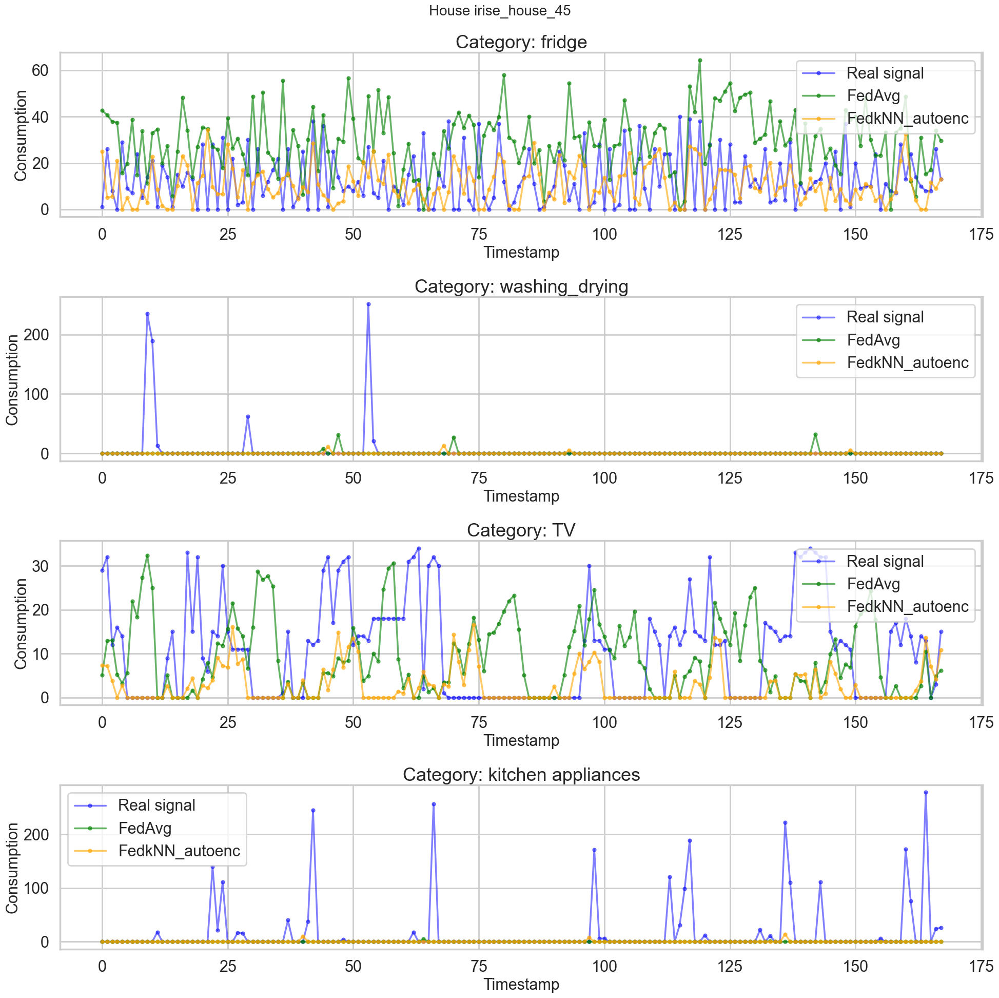

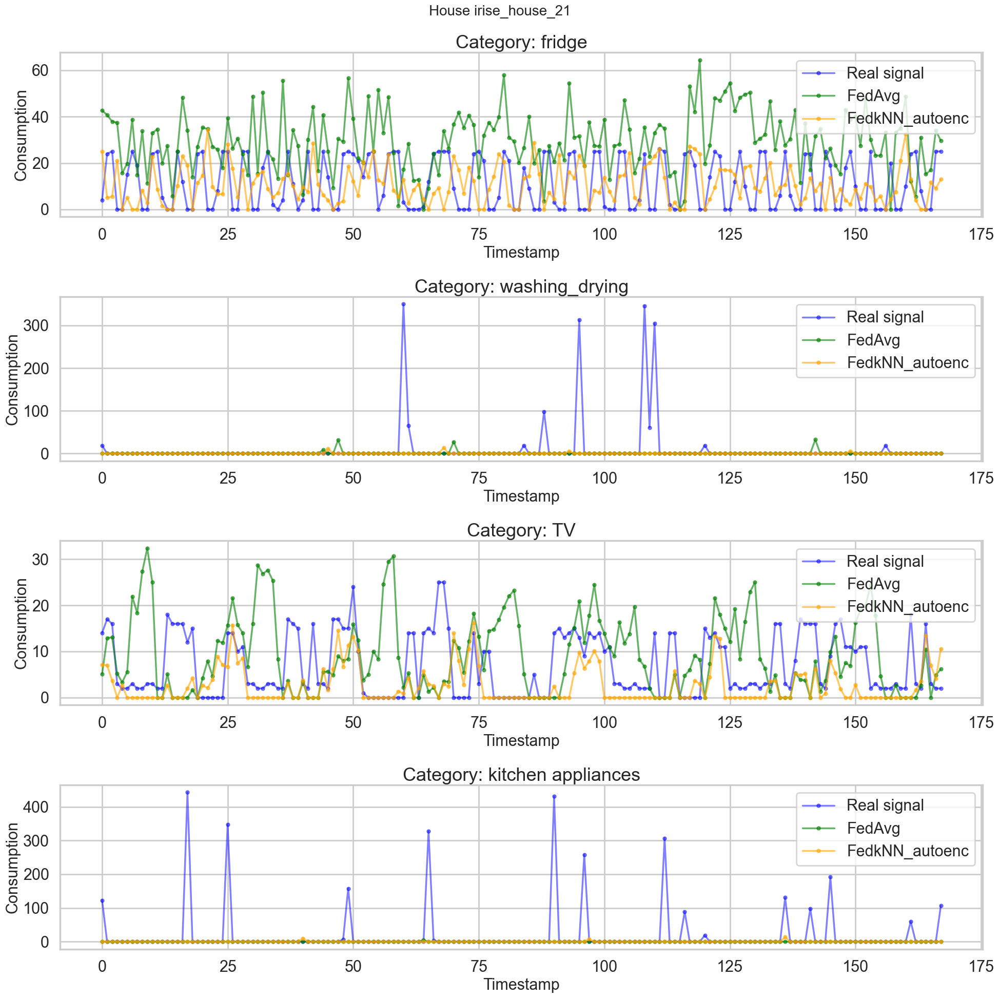

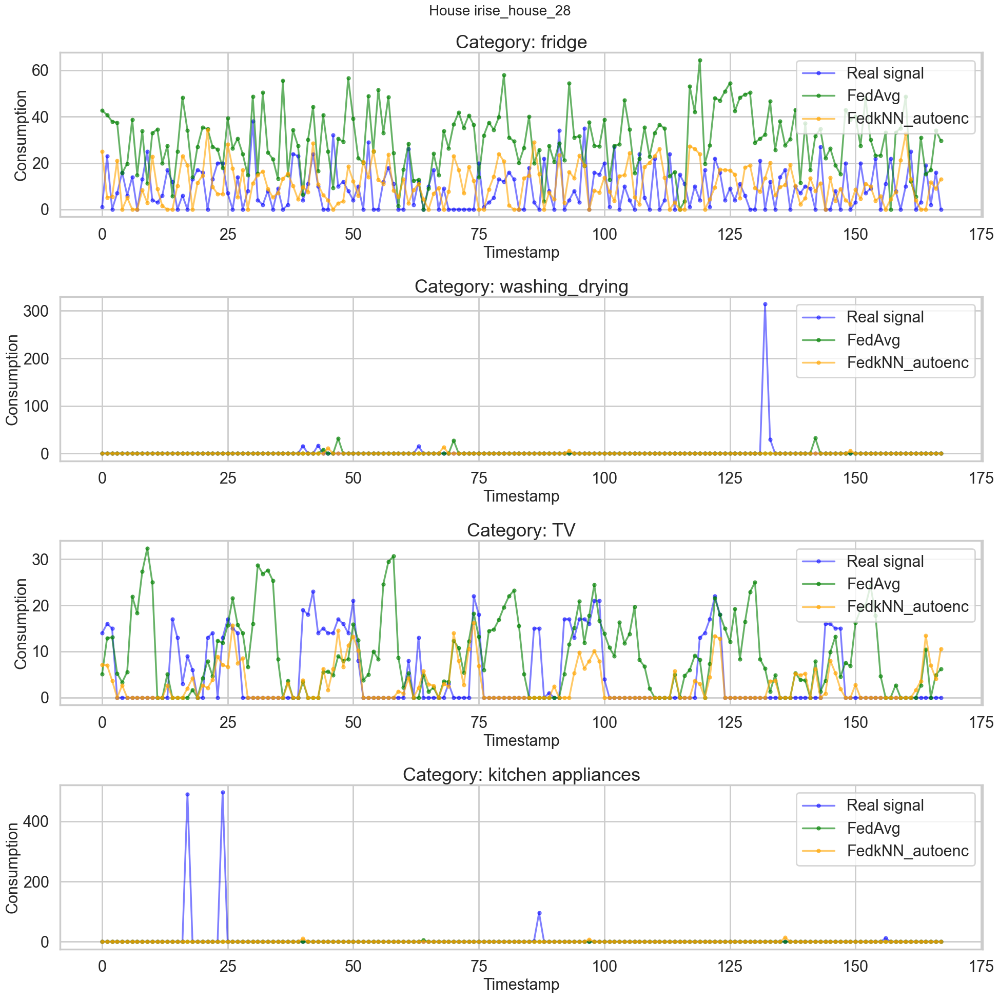

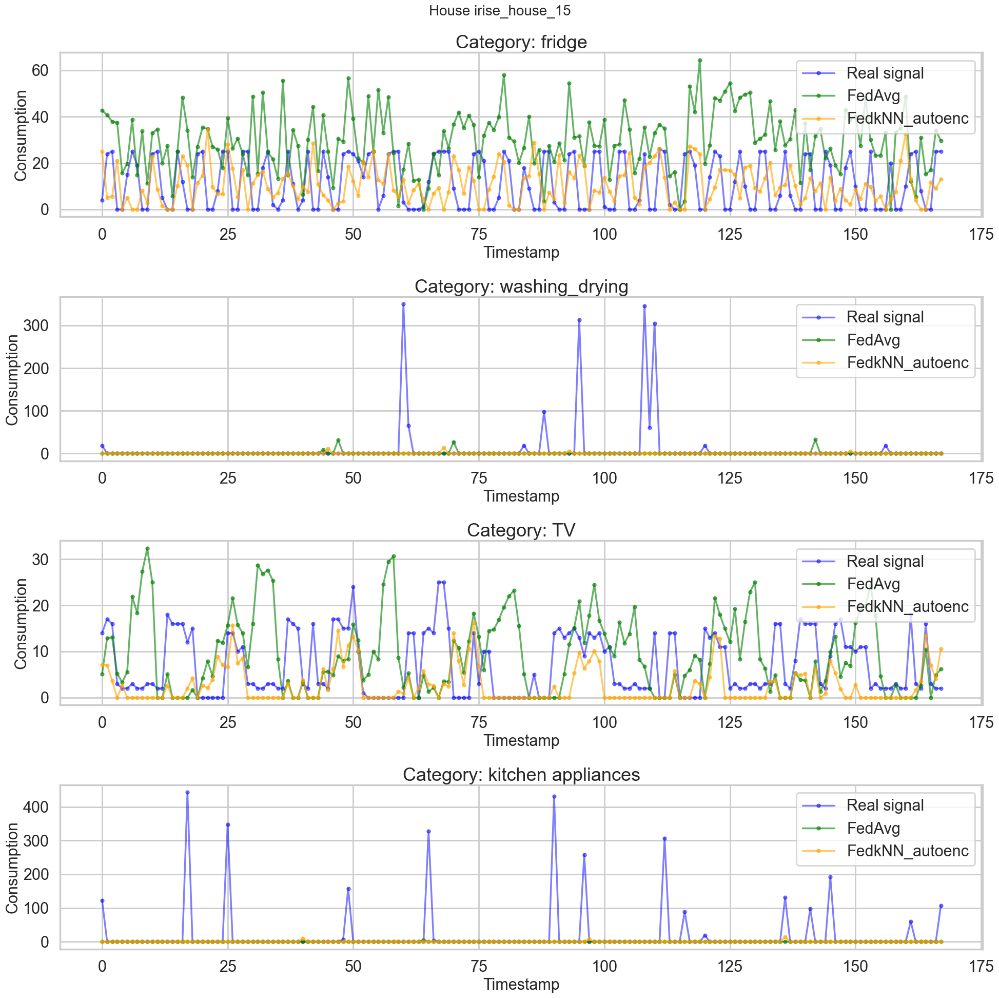

In [177]:
compare_method_plots(res, test, ['FedAvg', 'FedkNN_autoenc'], data_type='test')

In [73]:
error_df, nonzero_error_df, acc_df = package_results(res, appliance_categories, data_partition='test')

In [179]:
#error_df

In [180]:
#acc_df

In [181]:
#pd.DataFrame(time_dict.values(), index=time_dict.keys())

## Training on multiple weeks

In [81]:
weeks = [0, 2, 3, 5, 6, 7, 8, 9, 10, 12]

In [82]:
all_results = []
for week in weeks:
    try:
        t0 = time.time()
        res_output = output_results_for_week(week)
        all_results.append(res_output)
        print('Processed week {}, took {}s'.format(week, round(time.time() - t0)))
    except:
        print('Could not process week {}'.format(week))
        continue


Experiments for FedRBF
weight sum: [0.9999999999999999, 1.0, 1.0, 1.0000000000000002]
Aggregate function is FedRBF, fetched function <function FedDA at 0x2882a8f40>, func args are defaultdict(<class 'dict'>, {'fridge': array([2.34674107e-01, 2.50055040e-01, 2.09764426e-01, 2.30956569e-01,
       2.27859839e-10, 5.21646480e-14, 2.53216307e-14, 9.02223894e-06,
       3.40620103e-02, 2.56229270e-02, 1.27963648e-06, 9.22121007e-03,
       4.21349415e-13, 2.12750249e-03, 4.57431002e-26, 1.40094517e-04,
       2.73068062e-03, 2.94460648e-14, 6.35130583e-04]), 'washing_drying': array([1.51543936e-001, 1.83894797e-001, 1.55362772e-001, 1.80330126e-001,
       1.57918741e-100, 4.71523902e-058, 5.82856845e-022, 2.29690586e-002,
       1.47218449e-020, 1.28697717e-001, 9.46618334e-094, 6.51602611e-130,
       7.80264953e-006, 1.34849692e-001, 1.09155415e-026, 4.23441008e-002,
       1.38732443e-037, 6.37113435e-022, 2.17628676e-029]), 'TV': array([1.25947144e-01, 1.26220266e-01, 1.29430816e-01, 1

In [83]:
results = [x[0] for x in all_results]
time_dicts = [x[1] for x in all_results]

In [85]:
avg_error_df, avg_nonzero_error_df, avg_acc_df = [], [], []
for res in results:
    error_df, nonzero_error_df, acc_df = package_results(res, appliance_categories, data_partition='test')
    avg_error_df.append(error_df)
    avg_nonzero_error_df.append(nonzero_error_df)
    avg_acc_df.append(acc_df)

In [88]:
inds = avg_acc_df[0].index.tolist()
#inds

In [182]:
nrmse_df = pd.concat(avg_error_df).groupby(level=0).mean()
nrmse_df = nrmse_df[inds]
nrmse_df = nrmse_df.applymap(lambda x: f'{round(x * 100, 2)}%')
nrmse_df

In [ ]:
printable_df = []
for i in range(5):
    sub_df = nrmse_df.iloc[:,i*3:(i+1)*3]
    col_df = pd.DataFrame(sub_df.columns).T
    col_df.columns = sub_df.columns
    ind = sub_df.index.tolist()
    sub_df = pd.concat([col_df, sub_df], ignore_index=True)
    sub_df['Appliance'] = ['Method'] + ind
    new_order = [3, 0, 1, 2]
    sub_df = sub_df[sub_df.columns[new_order]]
    printable_df.append(pd.DataFrame(sub_df.values))

printable_df = pd.concat(printable_df, axis=0)
printable_df.index = printable_df.iloc[:, 0]
printable_df.drop(printable_df.columns[0], axis=1, inplace=True)
printable_df

In [183]:
#print(printable_df.to_latex())

In [184]:
eacc_df = pd.concat(avg_acc_df).groupby(level=0).mean()
eacc_df = eacc_df.loc[inds]
eacc_df = eacc_df.applymap(lambda x: f'{round(x * 100, 2)}%')
eacc_df

In [185]:
#print(eacc_df.to_latex())

In [185]:
time_df = pd.DataFrame(
    pd.DataFrame([list(tt.values()) for tt in time_dicts], columns=list(time_dicts[0].keys())).mean(axis=0)
)
time_df = time_df.apply(lambda x: round(x, 2))
time_df

,0
FedAvg,56.36
Fed_target_only,57.08
Fed_source_only,57.15
FedDA,57.39
FedDA_autoenc,62.46
FedDA_autoenc_reweight,63.07
FedRBF,57.21
FedRBF_autoenc,57.28
FedRBF_autoenc_reweight,57.25
FedMMD,57.54


In [186]:
#print(time_df.to_latex())